In [1]:
%matplotlib widget
import numpy as np
import sympy as sp

import matplotlib.pyplot as plt
from matplotlib.backend_bases import MouseButton

import cv2
import skimage as ski
from ipywidgets import interact, IntSlider, FloatSlider, FloatLogSlider
from IPython.display import display, Math

sp.init_printing()

# Transform Visualization

In [2]:
def bw_imshow(img):
    """ plot bw image"""
    with plt.ioff():
        fig, ax = plt.subplots(1, 1, figsize=(9, 9))
        #ax.axis('off')
        ax.imshow(img, cmap="gray", vmin=0, vmax=255)
        display(fig)

def warp(img, H):
    """ apply transformation given by H to image """
    return cv2.warpPerspective(img, H, 2*np.array(img.shape))

def matshow(H, n=2):
    display(Math(f'H = {sp.latex(sp.Matrix(np.round(H, n)))}'))

## Base image

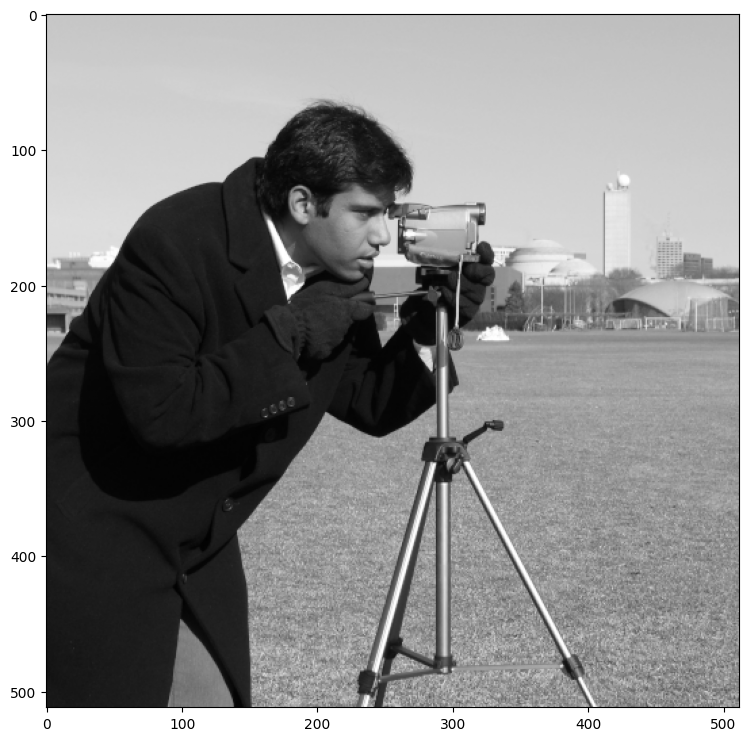

In [3]:
img = ski.data.camera()
W, H = img.shape
bw_imshow(img)

## Rigid Transform

$$\boldsymbol{H} = \begin{bmatrix} \boldsymbol{R}(\theta) & \boldsymbol{t} \\ \boldsymbol{0}^T & 1\end{bmatrix},$$
where
$$\boldsymbol{R}(\theta) = \begin{bmatrix} \cos(\theta) & -\sin(\theta) \\ \sin(\theta) & \cos(\theta) \end{bmatrix}.$$


 - Preserves parallelism
 - Preserves angles
 - Preserves areas
 - 3 DoF: $\theta, t_x, t_y$

In [4]:
def rigid_transform(dx=0.0, dy=0.0, theta=0):
    """
    apply rigid transformation to image.
    """
    # construct rotation matrix
    s, c = np.sin(theta*np.pi/180.0), np.cos(theta*np.pi/180.0)
    R = np.array([
        [c, -s],
        [s,  c]
    ])
    t = np.array([(dx, dy)]).T
    L = np.array([(0, 0, 1)])
    H = np.block([[R, t], [L]])

    matshow(H)
    bw_imshow(warp(img, H))
    
    


interact(rigid_transform,
         dx=FloatSlider(min=-W, max=W, step=1, value=0, description='dx'),
         dy=FloatSlider(min=-W, max=W, step=1, value=0, description='dy'),
         theta=FloatSlider(min=-180, max=180, step=5, value=0, description='$\\theta$')
        );

interactive(children=(FloatSlider(value=0.0, description='dx', max=512.0, min=-512.0, step=1.0), FloatSlider(v…

## Similarity Transform

$$\boldsymbol{H} = \begin{bmatrix} s\boldsymbol{R}(\theta) & \boldsymbol{t} \\ \boldsymbol{0}^T & 1\end{bmatrix}.$$

 - Preserves parallelism
 - Preserves angles
 - Isotropic scaling $s$ (positive) disrupts areas
 - 4 DoF: $\theta, t_x, t_y, s$

In [5]:
def similarity_transform(dx=0.0, dy=0.0, theta=0, scale=1.0):
    """
    apply similarity transformation to image.
    """
    # construct translation vector
    t = np.array([(dx, dy)]).T

    # construct rotation matrix
    s, c = np.sin(theta*np.pi/180.0), np.cos(theta*np.pi/180.0)
    R = np.array([
        [c, -s],
        [s,  c]
    ])

    # homogenous row
    L = np.array([(0, 0, 1)])

    # transformation matrix
    H = np.block([[scale*R, t], [L]])

    bw_imshow(warp(img, H))

interact(similarity_transform,
         dx=FloatSlider(min=-W, max=W, step=1, value=0, description='dx'),
         dy=FloatSlider(min=-W, max=W, step=1, value=0, description='dy'),
         theta=FloatSlider(min=-180, max=180, step=5, value=0, description='$\\theta$'),
         scale=FloatLogSlider(min=-1, max=np.log10(2), step=0.1, value=1, description='s')
        );

interactive(children=(FloatSlider(value=0.0, description='dx', max=512.0, min=-512.0, step=1.0), FloatSlider(v…

## Affine Transform

$$\boldsymbol{H} = \begin{bmatrix} \boldsymbol{A} & \boldsymbol{t} \\ \boldsymbol{0}^T & 1\end{bmatrix},$$
where
$\boldsymbol{A} = \boldsymbol{R}(\theta) \boldsymbol{R}^{-1}(\phi)\begin{bmatrix}k_1 & 0 \\ 0 & k_2 \end{bmatrix}\boldsymbol{R}(\phi).$

 - Preserves parallelism
 - Anisotropic scaling may change angles and areas
 - Negative $k$ allows for reflections
 - 6 DoF: $\theta, t_x, t_y, \phi, k_1, k_2$

In [6]:
def affine_transform(dx=0.0, dy=0.0, theta=0, phi=0, k1=1, k2=1):
    # construct translation vector
    t = np.array([(dx, dy)]).T

    # construct rotation matrix
    s, c = np.sin(theta*np.pi/180.0), np.cos(theta*np.pi/180.0)
    R = np.array([
        [c, -s],
        [s,  c]
    ])

    # stretching
    s, c = np.sin(phi*np.pi/180.0), np.cos(phi*np.pi/180.0)
    Rs = np.array([
        [c, -s],
        [s,  c]
    ])
    D = np.diag([k1, k2])
    
    # homogenous row
    L = np.array([(0, 0, 1)])

    # transformation matrix
    H = np.block([[R @ Rs @ D @ Rs.T, t], [L]])


    matshow(H)
    bw_imshow(warp(img, H))

interact(affine_transform,
         dx=FloatSlider(min=-W, max=W, step=1, value=0, description='dx'),
         dy=FloatSlider(min=-W, max=W, step=1, value=0, description='dy'),
         theta=FloatSlider(min=-180, max=180, step=5, value=0, description='$\\theta$'),
         phi=FloatSlider(min=0, max=90, step=5, value=0, description='$\\phi$'),
         k1=FloatSlider(min=-3, max=3, step=0.1, value=1, description='$k_1$'),
         k2=FloatSlider(min=-3, max=3, step=0.1, value=1, description='$k_2$'),);

interactive(children=(FloatSlider(value=0.0, description='dx', max=512.0, min=-512.0, step=1.0), FloatSlider(v…

## Projective Transform

$$\boldsymbol{H} = \begin{bmatrix} \boldsymbol{A} & \boldsymbol{t} \\ \boldsymbol{v}^T & v\end{bmatrix},$$
where $v \neq 0$.
 - Able to move infinity points
 - 8 DoF: $\theta, t_x, t_y, \phi, k_1, k_2, v_1, v_2$

In [7]:
def projective_transform(dx=0.0, dy=0.0, theta=0, phi=0, k1=1, k2=1, v1=0, v2=0):
    # construct translation vector
    t = np.array([(dx, dy)]).T

    # construct rotation matrix
    s, c = np.sin(theta*np.pi/180.0), np.cos(theta*np.pi/180.0)
    R = np.array([
        [c, -s],
        [s,  c]
    ])

    # stretching
    s, c = np.sin(phi*np.pi/180.0), np.cos(phi*np.pi/180.0)
    Rs = np.array([
        [c, -s],
        [s,  c]
    ])
    D = np.diag([k1, k2])
    
    # homogenous row
    L = np.array([(v1, v2, 1)])

    # transformation matrix
    H = np.block([[R @ Rs @ D @ Rs.T, t], [L]])


    matshow(H)
    bw_imshow(warp(img, H))

interact(projective_transform,
         dx=FloatSlider(min=-W, max=W, step=1, value=0, description='dx'),
         dy=FloatSlider(min=-W, max=W, step=1, value=0, description='dy'),
         theta=FloatSlider(min=-180, max=180, step=5, value=0, description='$\\theta$'),
         phi=FloatSlider(min=0, max=90, step=5, value=0, description='$\\phi$'),
         k1=FloatSlider(min=-3, max=3, step=0.1, value=1, description='$k_1$'),
         k2=FloatSlider(min=-3, max=3, step=0.1, value=1, description='$k_2$'),
         v1=FloatSlider(min=-0.01, max=0.01, step=0.001, value=0, description='$v_1$'),
         v2=FloatSlider(min=-0.01, max=0.01, step=0.001, value=0, description='$v_2$'),);

interactive(children=(FloatSlider(value=0.0, description='dx', max=512.0, min=-512.0, step=1.0), FloatSlider(v…

# Application example
Lets use transformations to remove projective distortions from the foor tiling below

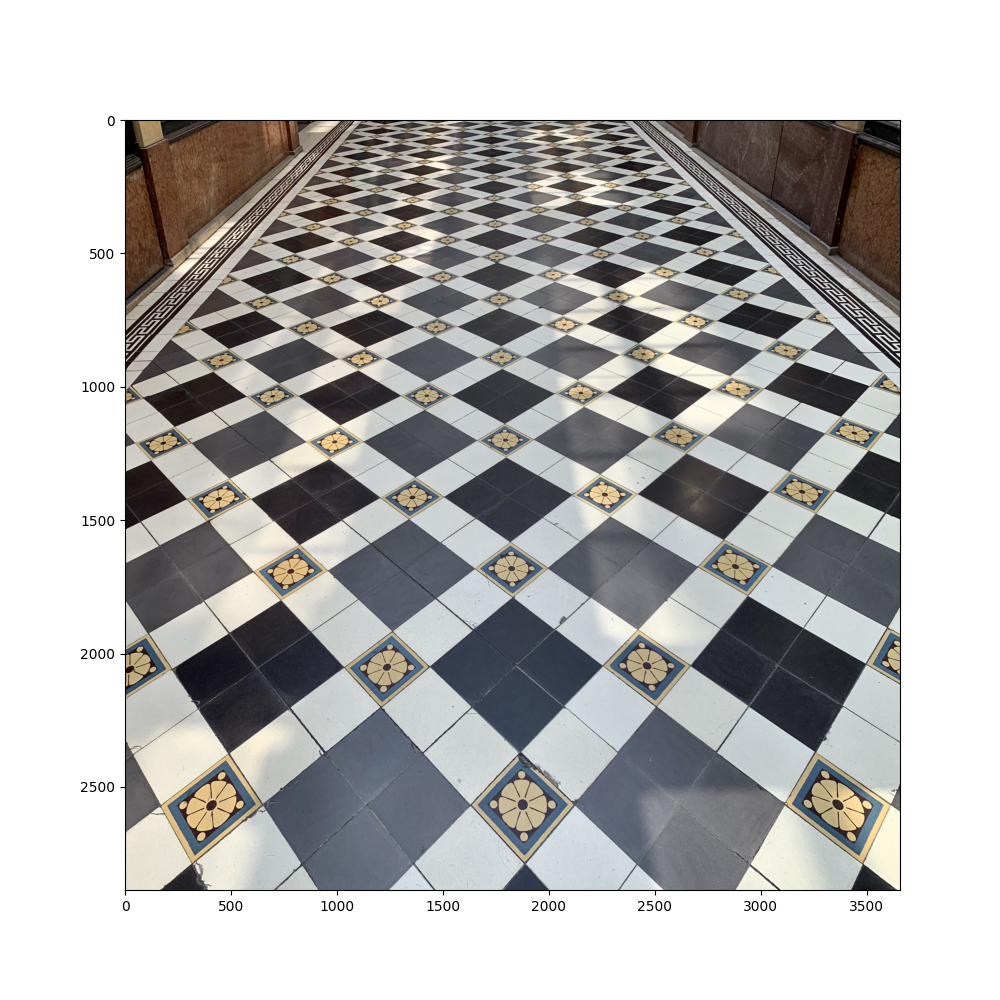

In [8]:
img = ski.io.imread("https://upload.wikimedia.org/wikipedia/commons/9/95/Tiled_floor_of_the_Passage_des_Princes_%28Paris%29.jpg")
fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(img, aspect='auto')

H, W, _ = img.shape
corners = [
    (0, 0),
    (0, W),
    (H, 0),
    (H, W)
]


## Affine Retification

A point in the infinity may be mapped to a finite point in image space.
A common example is horizon lines being visible in pictures.

If we want to warp our image so that a particular plane in space appears "frontal", it is sufficient to map ideal points
in that plane to improper points of the image.

Suppose that $$\bf l = \begin{bmatrix} l_1 \\ l_2 \\ l_3 \end{bmatrix}$$ is the ideal line as seen in our image.
Then consider the projective transform $$\boldsymbol{H}_P =
    \begin{bmatrix} 1 & 0 & 0\\0 & 1 & 0\\ l_1 & l_2 & l_3 \end{bmatrix}.$$
Its inverse can be computed as $$\boldsymbol{H}^{-1}_P =
    \begin{bmatrix} 1 & 0 & 0\\0 & 1 & 0\\ -l_1/l_3 & -l_2/l_3 & 1/l_3 \end{bmatrix}.$$

This transform is a transform that maps $\boldsymbol{l}$ to $\begin{bmatrix} 0 \\ 0 \\ 1 \end{bmatrix}$, since lines are transformed
through $\boldsymbol{l}' = \boldsymbol{H} ^{-T}\boldsymbol{l}$.

On the figure below, click on pairs of points that form parallel lines.
Once 4 lines are formed, we can compute the homography.

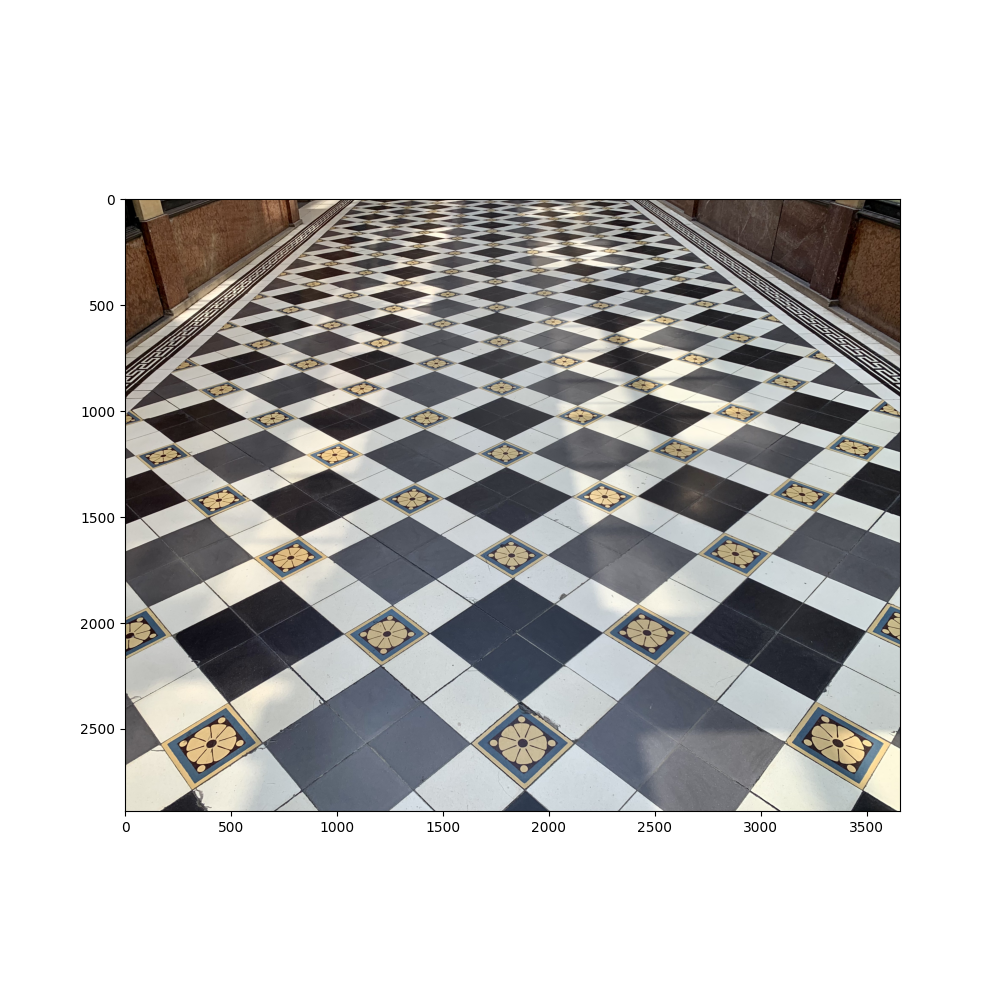

In [9]:
fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(img)

projective_points = []

def onclick(event):
    if len(projective_points) < 8:
        position = (event.xdata, event.ydata)
        projective_points.append(position)
        plt.scatter(*position)

        if (len(projective_points) % 2) == 0:
            a, b = projective_points[-2], projective_points[-1]
            plt.plot([a[0], b[0]], [a[1], b[1]])
    else:
        plt.disconnect(binding_id)
        

binding_id = plt.connect('button_press_event', onclick)

## Compute position of ideal points
$$p_A = l_1 \times l_2,$$
$$p_B = l_3 \times l_4,$$

In [10]:
# Adjacent points yield lines
parallel_lines = []
for a, b in zip(projective_points[::2], projective_points[1::2]):
    l = np.cross([*a, 1], [*b, 1])
    l /= np.abs(l).sum() # L1 normalization (optional)
    parallel_lines.append(l)

ideal_points = []
for l, m in zip(parallel_lines[::2], parallel_lines[1::2]):
    p = np.cross(l, m)
    p /= p[-1] # make homogenous
    ideal_points.append(p)

p_A, p_B = ideal_points
ideal_line = np.cross(p_A, p_B)
ideal_line /= ideal_line[-1]

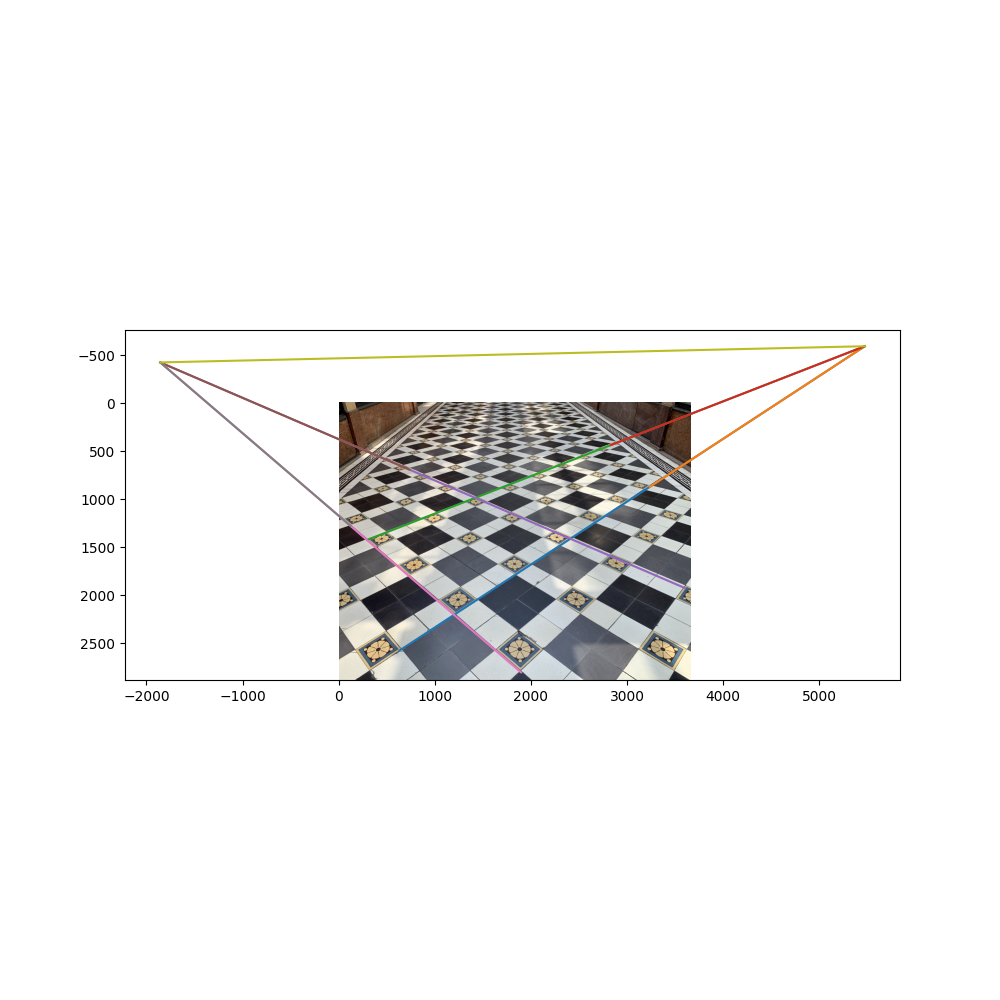

In [11]:
# draw lines
fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(img)

for p_i in projective_points[:4]:
    x0, y0 = p_i
    ax.plot([x0, p_A[0]], [y0, p_A[1]])

for p_i in projective_points[4:]:
    x0, y0 = p_i
    ax.plot([x0, p_B[0]], [y0, p_B[1]])

ax.plot([p_A[0], p_B[0]], [p_A[1], p_B[1]])

In [12]:
# Assemble projective transform
H_proj = np.array([
    (1, 0, 0),
    (0, 1, 0),
    ideal_line
])
matshow(H_proj, 5)

<IPython.core.display.Math object>

In [13]:
def compute_bounds(points, H):
    h_points = np.array([[*p, 1] for p in points]).T
    transformed_points = H @ h_points
    transformed_points /= transformed_points[-1]
    W, H, _ = np.max(transformed_points, axis=-1)
    return (int(W), int(H))

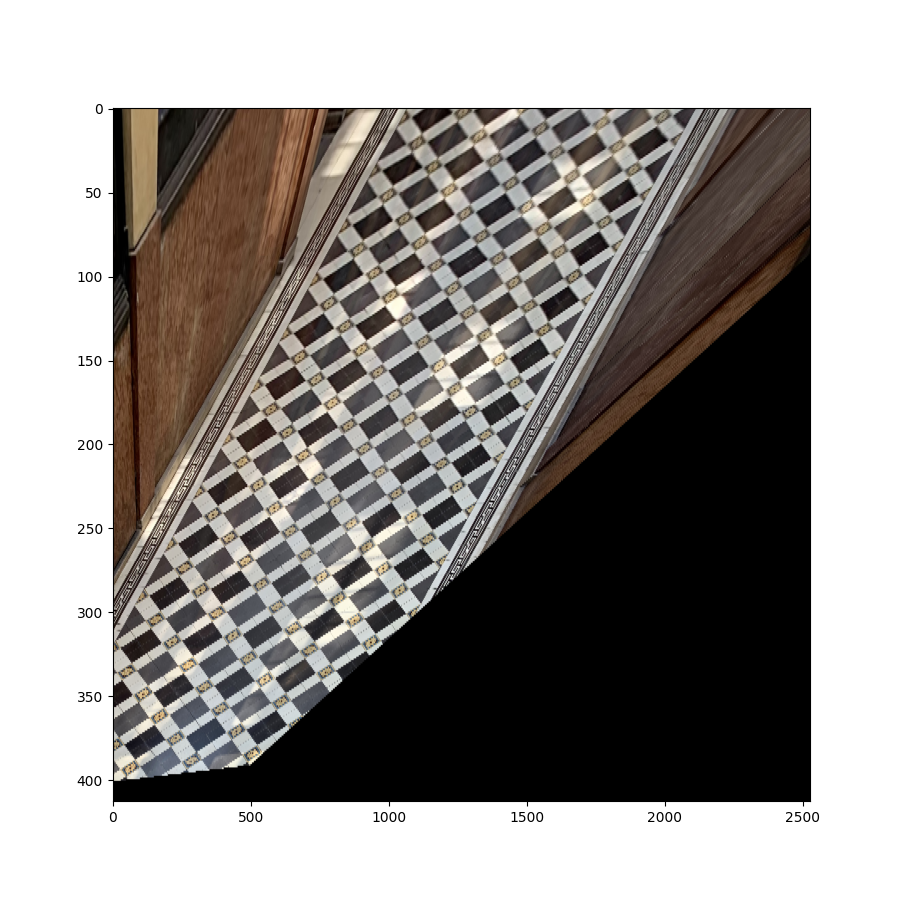

In [15]:
bounds = compute_bounds(corners, H_proj)
warped = cv2.warpPerspective(img, H_proj, bounds)
plt.figure(figsize=(9, 9))
plt.imshow(warped, aspect='auto');

## Metric retification

The first step made parallel lines in the real world parallel in the image, although the angles are not correct, that is,
physically orthogonal lines do not appear orthogonal.

What we want to find is an Affine transformation that corrects the angles.

We know that for physically orthogonal lines, say $\boldsymbol{l}, \boldsymbol{m}$, we have
$$  \boldsymbol{l}^T \boldsymbol{C}^*_\infty \boldsymbol{m} = 0,$$
where 
$$\boldsymbol{C}^*_\infty  = \begin{bmatrix} 1 & 0 & 0 \\ 0 & 1 & 0 \\ 0 & 0 & 0\end{bmatrix}.$$

Lines as seen in the image, however, are transformed through an unknown mapping $\boldsymbol{H}_A$, where
$$\boldsymbol{H}_A =
    \begin{bmatrix} \boldsymbol{A} & \boldsymbol{t} \\
                    \boldsymbol{0}^T & 1\end{bmatrix}.$$

Since $\boldsymbol{l}' = \boldsymbol{H}_A^{-T}\boldsymbol{l}$, that is, $\boldsymbol{H}_A^T \boldsymbol{l}' = \boldsymbol{l}$, we have
$$  \boldsymbol{l}'^T \boldsymbol{H}_A \boldsymbol{C}^*_\infty \boldsymbol{H}_A^T \boldsymbol{m}' = 0.$$

Expanding this equation gives
$$\begin{aligned}
    \boldsymbol{l}'^T \boldsymbol{H}_A \boldsymbol{C}^*_\infty \boldsymbol{H}_A^T \boldsymbol{m}' &= 0,\\
    \boldsymbol{l}'^T
        \begin{bmatrix} \boldsymbol{A} & \boldsymbol{t} \\ \boldsymbol{0}^T & 1\end{bmatrix}
        \begin{bmatrix} \boldsymbol{I} & \boldsymbol{0} \\ \boldsymbol{0}^T & 0\end{bmatrix}
        \begin{bmatrix} \boldsymbol{A}^T & \boldsymbol{0} \\ \boldsymbol{t}^T & 1\end{bmatrix}
        \boldsymbol{m}' &= 0,\\
        \boldsymbol{l}'^T
        \begin{bmatrix} \boldsymbol{A}\boldsymbol{A}^T & \boldsymbol{0} \\ \boldsymbol{0}^T & 0\end{bmatrix}
        \boldsymbol{m}' &= 0.\\
\end{aligned}.$$

Now consider the symmetric matrix $\boldsymbol{S} = \boldsymbol{A}\boldsymbol{A}^T$. Due to the scale unknown we may fix one of its
diagonal elements as $1$, such that
$$\begin{bmatrix} s_{11} & s_{12} \\ s_{12} & 1\end{bmatrix}.$$

This means that
$$\begin{aligned}
\begin{bmatrix}l'_1 & l'_2 \end{bmatrix} \begin{bmatrix} s_{11} & s_{12} \\ s_{12} & 1\end{bmatrix} \begin{bmatrix}m'_1 \\ m'_2 \end{bmatrix} &= 0,\\
l'_1 m'_1 s_{11} + (l'_1 m'_2 + l'_2 m'_1) s_{12} + l'_2 m'_2 &= 0,\\
\begin{bmatrix} l'_1 m'_1 & l'_1 m'_2 + l'_2 m'_1 \end{bmatrix}
\begin{bmatrix} s_{11} \\ s_{12} \end{bmatrix} &= -l'_2 m'_2.
\end{aligned}$$
In other words, any pair of known orthogonal lines in the image yields a equation on the coefficients of $\boldsymbol{S}$, and ultimately in the coefficients of $\boldsymbol{A}$.

Lets use this method to find $\boldsymbol{H}_A$.

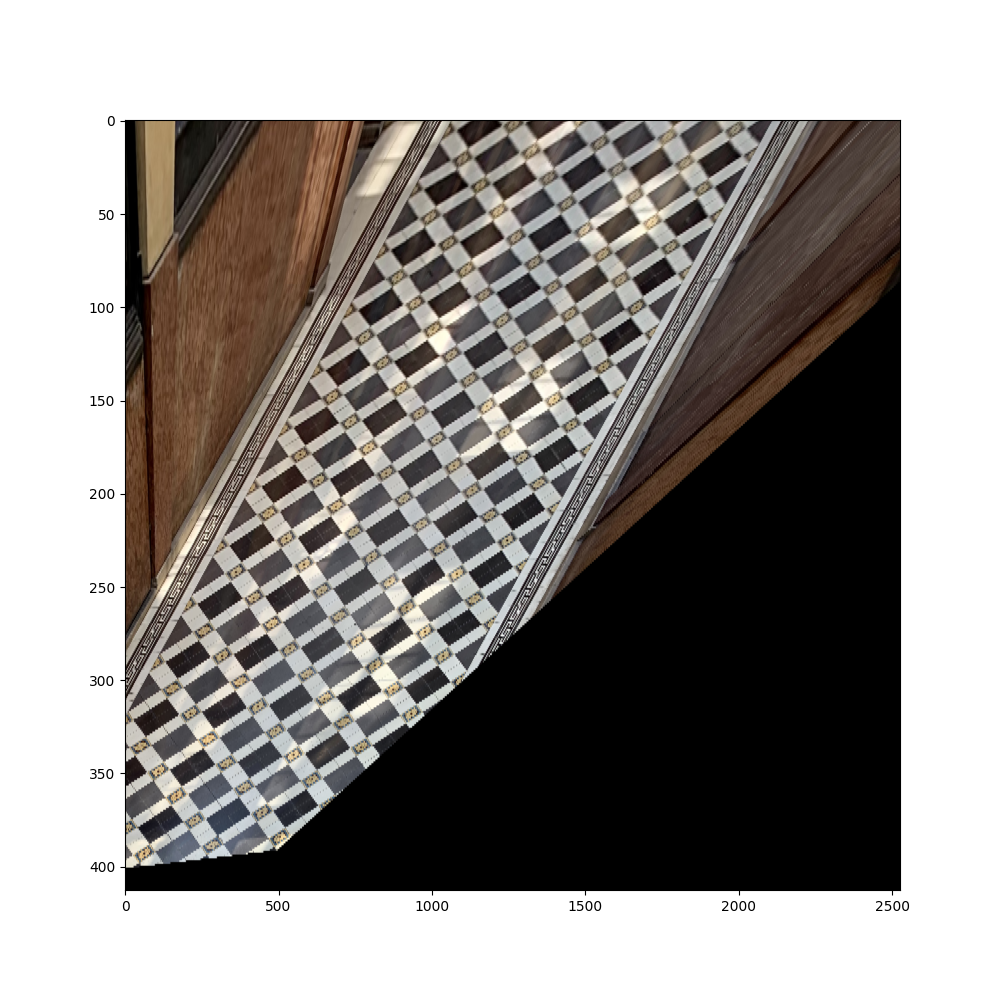

In [16]:
fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(warped, aspect="auto")

orthogonal_points = []

def onclick(event):
    if len(orthogonal_points) < 8:
        position = (event.xdata, event.ydata)
        orthogonal_points.append(position)
        plt.scatter(*position)

        if (len(orthogonal_points) % 2) == 0:
            a, b = orthogonal_points[-2], orthogonal_points[-1]
            plt.plot([a[0], b[0]], [a[1], b[1]])
    else:
        plt.disconnect(binding_id)
        

binding_id = plt.connect('button_press_event', onclick)

In [17]:
# Adjacent points yield lines
ortho_lines = []
for a, b in zip(orthogonal_points[::2], orthogonal_points[1::2]):
    l = np.cross([*a, 1], [*b, 1])
    l /= np.abs(l).sum() # L1 normalization (optional)
    ortho_lines.append(l)

# ortho pairs yield equations
A = []
b = []
for l, m in zip(ortho_lines[::2], ortho_lines[1::2]):
    l1, l2, _ = l
    m1, m2, _ = m
    A.append([l1*m1, l1*m2 +l2*m1])
    b.append(-l2*m2)

#solve for s11, s12
(s11, s12), _, _, _ = np.linalg.lstsq(A, b)
S = np.array([
    [s11, s12],
    [s12, 1]
])
A = np.linalg.cholesky(S)
A /= np.sqrt(np.linalg.det(A)) # make determinant 1 to normalize gain
H_A = np.eye(3)
H_A[:2, :2] = A

# Remember H_A is the mapping currently in the image!
# we need its inverse
H_A = np.linalg.inv(H_A)
matshow(H_A, 5)

<IPython.core.display.Math object>

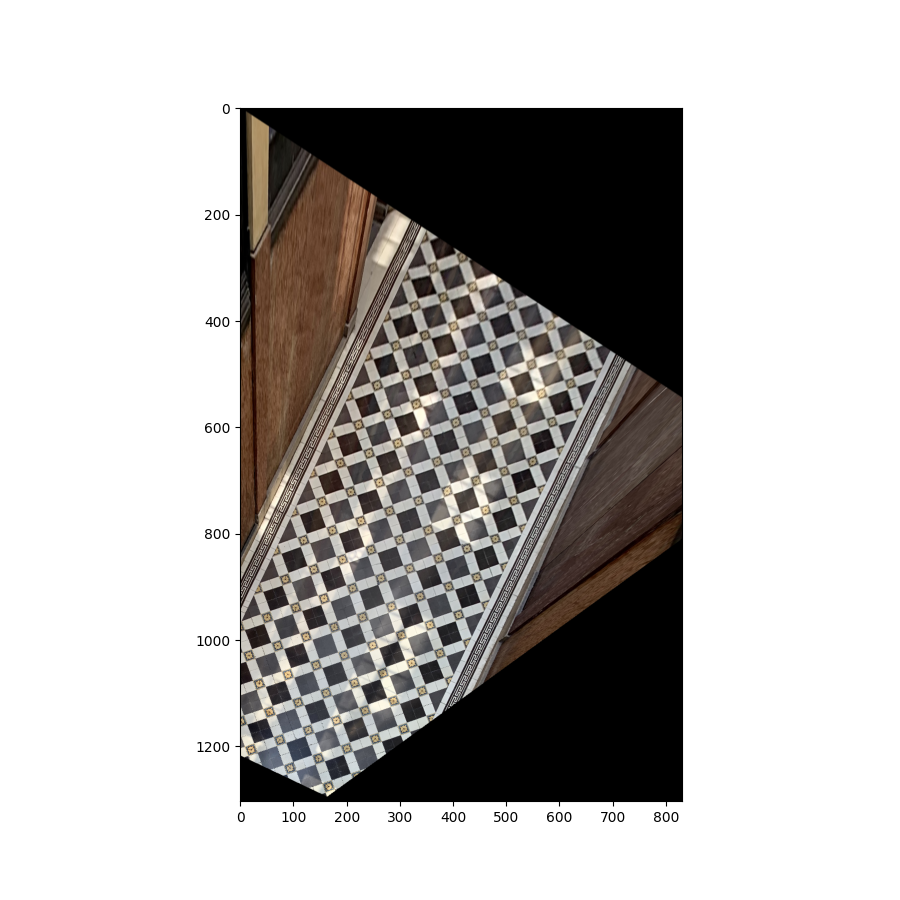

In [18]:
bounds = compute_bounds(corners, H_A @ H_proj)
affine = cv2.warpPerspective(img, H_A @ H_proj, bounds)
plt.figure(figsize=(9, 9))
plt.imshow(affine);